# Principal Diamaters Measurement for grains

docs

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import skimage
from skimage.measure import regionprops, label
from mpl_toolkits.mplot3d import Axes3D
import scipy
%matplotlib widget
# %matplotlib inline

In [3]:
def find_and_plot_principal_diameters(binary_volume,xlim=None, ylim=None, zlim=None):
    volume = binary_volume


    props = regionprops(label(binary_volume))[0]
    center = np.array(props.centroid) 
    inertia_matrix = props.inertia_tensor

    eigenvalues, eigenvectors = np.linalg.eig(inertia_matrix)
    sorted_indices = np.argsort(-eigenvalues)  # Sorted by largest eigenvalues
    eigenvectors = eigenvectors[:, sorted_indices]

    axis_1 = eigenvectors[:,0]  
    axis_2 = eigenvectors[:,1]   
    axis_3 = eigenvectors[:,2]   

    axis_4 = -eigenvectors[:,0] 
    axis_5 = -eigenvectors[:,1] 
    axis_6 = -eigenvectors[:,2]   


    arrow_data = {
        'Arrow1': {'coords': [], 'binary_data': [], 'radius': []},
        'Arrow2': {'coords': [], 'binary_data': [], 'radius': []},
        'Arrow3': {'coords': [], 'binary_data': [], 'radius': []},

        'Arrow4': {'coords': [], 'binary_data': [], 'radius': []},
        'Arrow5': {'coords': [], 'binary_data': [], 'radius': []},
        'Arrow6': {'coords': [], 'binary_data': [], 'radius': []}
    }


    arrow_1 = Arrow3D(None, center, axis_1, length=1, color='r')
    arrow_2 = Arrow3D(None, center, axis_2, length=1, color='g')
    arrow_3 = Arrow3D(None, center, axis_3, length=1, color='b')

    arrow_4 = Arrow3D(None, center, axis_4, length=1, color='r')
    arrow_5 = Arrow3D(None, center, axis_5, length=1, color='g')
    arrow_6 = Arrow3D(None, center, axis_6, length=1, color='b')

    # Increase radius incrementally
    max_radius = 100  # Set maximum radius
    for radius in range(1, max_radius + 1):
        # arrow coordinates for each radius
        for arrow, arrow_obj in zip(['Arrow1', 'Arrow2', 'Arrow3', 'Arrow4', 'Arrow5', 'Arrow6'], 
                                    [arrow_1, arrow_2, arrow_3, arrow_4, arrow_5, arrow_6]):
            # coordinates for the current radius
            coord = center + radius * arrow_obj.direction

            x, y, z = map(int, coord)  # coordinates to integers
            if 0 <= x < volume.shape[0] and 0 <= y < volume.shape[1] and 0 <= z < volume.shape[2]:
                binary_data = volume[x, y, z]
            else:
                binary_data = -1  # out-of-bounds coordinates

            arrow_data[arrow]['coords'].append(coord)
            arrow_data[arrow]['binary_data'].append(binary_data)
            arrow_data[arrow]['radius'].append(radius)


    extracted_coords = []
    extracted_lengths = []
    arrow_names = []

    for arrow, data in arrow_data.items():
        zero_index = np.where(np.array(arrow_data[arrow]['binary_data'])==0)[0]  # Find indices with zero binary data
        if zero_index.size > 0:  # If zero index exists
            first_zero_index = zero_index[0]  # Get the index of the first zero binary result
            extracted_coords.append(arrow_data[arrow]['coords'][first_zero_index])  # Extract corresponding coordinates
            extracted_lengths.append(arrow_data[arrow]['radius'][first_zero_index])  # Extract corresponding length
            arrow_names.append(arrow)  # Store arrow name

    ## print the extracted coordinates and lengths
    # for arrow, coords, length in zip(arrow_names, extracted_coords, extracted_lengths):
    #     print(f"{arrow}, Coordinates: {coords}, Length: {length}")

    dimater_array = {
        'Principal Diameter 1 (red)': extracted_lengths[0]+extracted_lengths[3],
        'Principal Diameter 2 (green)': extracted_lengths[1]+extracted_lengths[4],
        'Principal Diameter 3 (blue)': extracted_lengths[2]+extracted_lengths[5],
    }
    print('\n')
    for diameter_name, diameter_length in dimater_array.items():
        print(f"{diameter_name}, Length: {diameter_length}")

    verts, faces, _, _ = skimage.measure.marching_cubes(volume, level=0)

    # Plotting
    fig = plt.figure(figsize=(8,10))
    ax = fig.add_subplot(111, projection='3d')
    # ax.view_init(elev=30, azim=30, roll=0)
    
    # Plot the surface
    ax.plot_trisurf(verts[:, 0], verts[:, 1], faces, verts[:, 2], color='r',alpha=0.1)


    custom_coords = {
        'Arrow1': extracted_coords[0], 
        'Arrow2': extracted_coords[1],  
        'Arrow3': extracted_coords[2],
        'Arrow4': extracted_coords[3],
        'Arrow5': extracted_coords[4],
        'Arrow6': extracted_coords[5]
    }

    custom_lengths = {
        'Arrow1': extracted_lengths[0], 
        'Arrow2': extracted_lengths[1],
        'Arrow3': extracted_lengths[2],
        'Arrow4': extracted_lengths[3],
        'Arrow5': extracted_lengths[4],
        'Arrow6': extracted_lengths[5]
    }

    col = ['red','orange','blue','red','orange','blue']


    for i, info in enumerate(custom_coords.items()):
        arrow, coords = info
        direction = coords - center
        direction /= np.linalg.norm(direction)
        ax.quiver(
            center[0], center[1], center[2], direction[0], direction[1], direction[2],
            color=col[i], length=custom_lengths[arrow], arrow_length_ratio=0.1
        )

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    if xlim is not None:
        ax.set_xlim(xlim)
    if ylim is not None:
        ax.set_ylim(ylim)
    if zlim is not None:
        ax.set_zlim(zlim)

    ax.set_box_aspect([np.ptp(verts[:, 0]), np.ptp(verts[:, 1]), np.ptp(verts[:, 2])])

    plt.show()

In [4]:
# Arrow class
class Arrow3D:
    def __init__(self, ax, start, direction, length=1, mutation_scale=20, arrowstyle='-|>', color='black'):
        self.ax = ax
        self.start = start
        self.direction = direction
        self.length = length
        self.mutation_scale = mutation_scale
        self.arrowstyle = arrowstyle
        self.color = color

    def draw(self):
        arrow_prop_dict = dict(mutation_scale=self.mutation_scale, arrowstyle=self.arrowstyle, color=self.color)
        end = self.start + self.length * self.direction
        self.ax.quiver(self.start[0], self.start[1], self.start[2], self.direction[0], self.direction[1],
                       self.direction[2], length=self.length, **arrow_prop_dict)
        self.ax.text(end[0], end[1], end[2], f'  {self.length}', color=self.color, fontsize=8)

# Function to plot arrows in the principal directions (radius version):
def find_and_plot_principal_radiuses(binary_volume):
    volume = binary_volume

    # Define the principal axes (eigenvectors)
    # Assuming principal axes are represented by vectors in 3D space
    # For example:
    axis_1 = eigenvectors[:,0]  
    axis_2 = eigenvectors[:,1] 
    axis_3 = eigenvectors[:,2] 


    arrow_data = {
        'Arrow1': {'coords': [], 'binary_data': [], 'radius': []},
        'Arrow2': {'coords': [], 'binary_data': [], 'radius': []},
        'Arrow3': {'coords': [], 'binary_data': [], 'radius': []}
    }

    arrow_1 = Arrow3D(None, center, axis_1, length=1, color='r')
    arrow_2 = Arrow3D(None, center, axis_2, length=1, color='g')
    arrow_3 = Arrow3D(None, center, axis_3, length=1, color='b')


    max_radius = 100  # Set maximum radius
    for radius in range(1, max_radius + 1):

        for arrow, arrow_obj in zip(['Arrow1', 'Arrow2', 'Arrow3'], [arrow_1, arrow_2, arrow_3]):

            coord = center + radius * arrow_obj.direction


            x, y, z = map(int, coord)  # coordinates to integers
            if 0 <= x < volume.shape[0] and 0 <= y < volume.shape[1] and 0 <= z < volume.shape[2]:
                binary_data = volume[x, y, z]
            else:
                binary_data = -1  # out-of-bounds coordinates


            arrow_data[arrow]['coords'].append(coord)
            arrow_data[arrow]['binary_data'].append(binary_data)
            arrow_data[arrow]['radius'].append(radius)


    # for arrow, data in arrow_data.items():
    #     print(f"Arrow: {arrow}")
    #     for coord, binary, radius in zip(data['coords'], data['binary_data'], data['radius']):
    #         print(f"Coordinate: {coord}, Binary Data: {binary}, Radius: {radius}")

    extracted_coords = []
    extracted_lengths = []
    arrow_names = []

    for arrow, data in arrow_data.items():
        zero_index = np.where(np.array(arrow_data[arrow]['binary_data'])==0)[0]  
        if zero_index.size > 0:  # If zero index exists
            first_zero_index = zero_index[0]  # Get the index of the first zero binary result
            extracted_coords.append(arrow_data[arrow]['coords'][first_zero_index])  
            extracted_lengths.append(arrow_data[arrow]['radius'][first_zero_index]) 
            arrow_names.append(arrow) 

    # # Display the extracted coordinates and lengths
    # for arrow, coords, length in zip(arrow_names, extracted_coords, extracted_lengths):
    #     print(f"Arrow: {arrow}, Coordinates: {coords}, Length: {length}")


    verts, faces, _, _ = skimage.measure.marching_cubes(volume, level=0)

    # Plotting
    fig = plt.figure(figsize=(8,10))
    ax = fig.add_subplot(111, projection='3d')

    # Plot the surface
    ax.plot_trisurf(verts[:, 0], verts[:, 1], faces, verts[:, 2], color='r',alpha=0.1)


    custom_coords = {
        'Arrow1': extracted_coords[0],  
        'Arrow2': extracted_coords[1],  
        'Arrow3': extracted_coords[2]  
    }
    custom_lengths = {
        'Arrow1': extracted_lengths[0], 
        'Arrow2': extracted_lengths[1],  
        'Arrow3': extracted_lengths[2]
    } 

    col = ['red','orange','blue']

    # Plotting the custom arrows for each principal axis at specified coordinates and lengths
    for i, info in enumerate(custom_coords.items()):
        arrow, coords = info
        direction = coords - center
        direction /= np.linalg.norm(direction)
        ax.quiver(
            center[0], center[1], center[2], direction[0], direction[1], direction[2],
            color=col[i], length=custom_lengths[arrow], arrow_length_ratio=0.1
        )

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    ax.set_box_aspect([np.ptp(verts[:, 0]), np.ptp(verts[:, 1]), np.ptp(verts[:, 2])])

    plt.show()

# Cube <a class="anchor" id="chapter1"></a>

In [5]:
#cube
frame = np.zeros((100, 100, 100))

cube_width = 20

start_x = (frame.shape[0] - cube_width) // 2
end_x = start_x + cube_width
start_y = (frame.shape[1] - cube_width) // 2
end_y = start_y + cube_width
start_z = (frame.shape[2] - cube_width) // 2
end_z = start_z + cube_width

cube = frame
cube[start_x:end_x, start_y:end_y, start_z:end_z] = 1
cube = cube.astype(int)

In [6]:
props = skimage.measure.regionprops(cube)
verts, faces, _, _ =skimage.measure.marching_cubes(cube)
area_mc = skimage.measure.mesh_surface_area(verts, faces)

print(f'Width = {cube_width}')
print(f'Area - calculated = {6*cube_width}')
print(f'Volume - calculated = {cube_width**3}')

print('*******************************************************')

print(f'Axis major length = {props[0].axis_major_length}')
print(f'Axis minor length = {props[0].axis_minor_length}')
print(f'Max. Feret Diameter = {props[0].feret_diameter_max}')

print(f'Area - skimage marching cubes = {area_mc}')
print(f'Area - skimage regionprops = {props[0].area}')
print(f'Number of pixels - skimage measureprops = {props[0].num_pixels}')

print('*******************************************************')

print(f'Centroid - skimage measureprops = {props[0].centroid}')
print(f'Inertia tensor - skimage measureprops = \n{props[0].inertia_tensor}')
print(f'Inertia tensor eigenvalues - skimage measureprops = {props[0].inertia_tensor_eigvals}')

Width = 20
Area - calculated = 120
Volume - calculated = 8000
*******************************************************
Axis major length = 25.787593916455254
Axis minor length = 25.787593916455254
Max. Feret Diameter = 33.49626844888845
Area - skimage marching cubes = 2328.95263671875
Area - skimage regionprops = 8000.0
Number of pixels - skimage measureprops = 8000
*******************************************************
Centroid - skimage measureprops = (49.5, 49.5, 49.5)
Inertia tensor - skimage measureprops = 
[[66.5 -0.  -0. ]
 [-0.  66.5 -0. ]
 [-0.  -0.  66.5]]
Inertia tensor eigenvalues - skimage measureprops = [66.5, 66.5, 66.5]


### Calculating Principal Diameters

In [7]:
eigenvalues, eigenvectors = np.linalg.eig(props[0].inertia_tensor)
center = props[0].centroid
print(eigenvalues)
print(eigenvectors)
print(center)

[66.5 66.5 66.5]
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
(49.5, 49.5, 49.5)


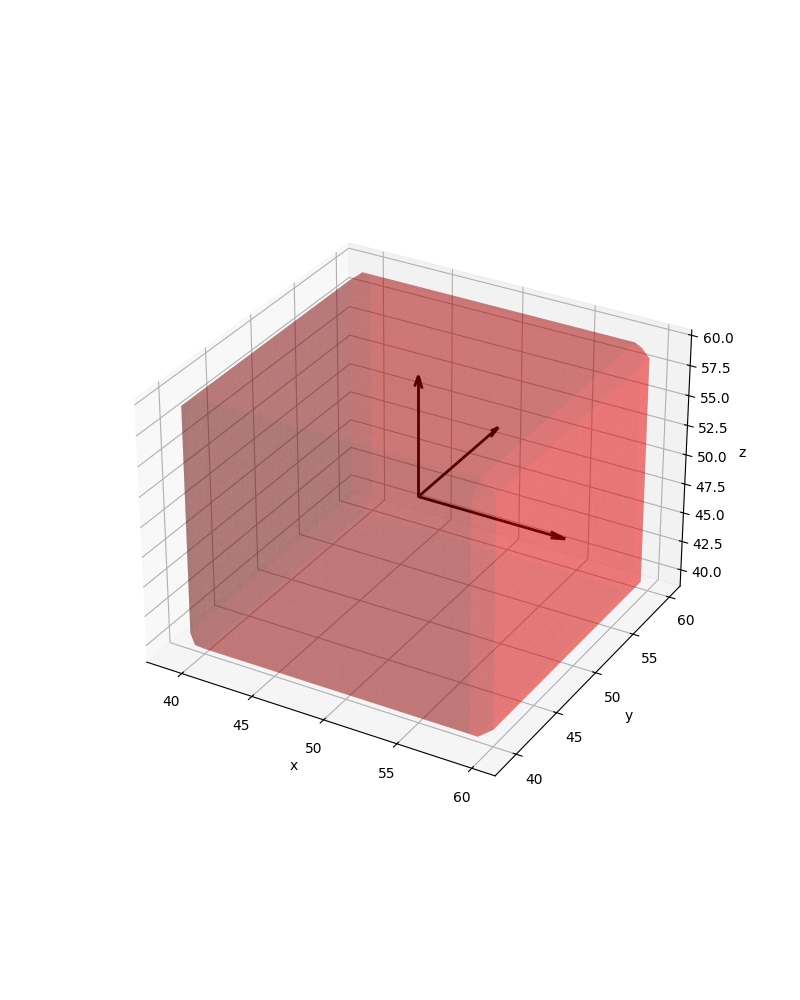

In [8]:
axes = [100,100,100]
data = np.ones(axes, dtype=bool)

 
# Plot figure
fig = plt.figure(figsize=(8,10))
ax = fig.add_subplot(111, projection='3d')

verts, faces, _, _ = skimage.measure.marching_cubes(cube, level=0)

# Plot the surface
ax.plot_trisurf(verts[:, 0], verts[:, 1], faces, verts[:, 2], color='r',alpha=0.3)


X0,Y0,Z0 = center
X1,Y1,Z1 = zip(*eigenvectors)
ax.quiver(X0,Y0,Z0,X1,Y1,Z1, length = 10, edgecolors='k', lw=2, arrow_length_ratio=0.1)

ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
plt.show()
ax.set_xlim(35,65)
ax.set_ylim(35,65)
ax.set_zlim(35,65)

ax.set_box_aspect([np.ptp(verts[:, 0]), np.ptp(verts[:, 1]), np.ptp(verts[:, 2])])


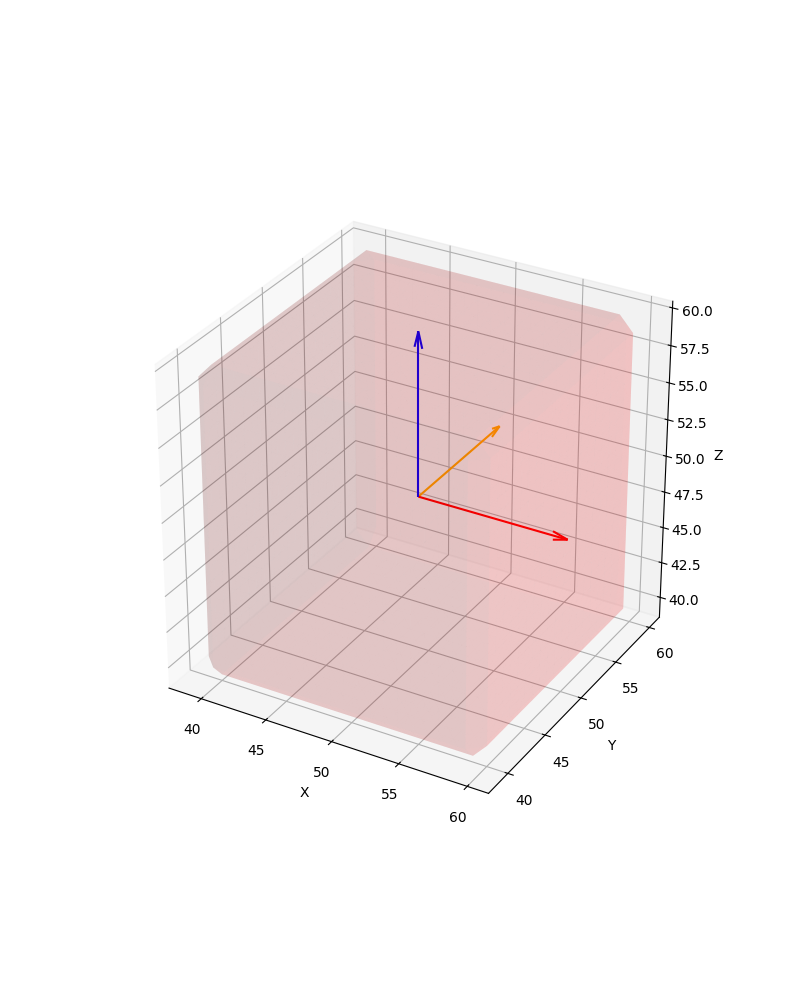

In [9]:
find_and_plot_principal_radiuses(cube)



Principal Diameter 1 (red), Length: 21
Principal Diameter 2 (green), Length: 21
Principal Diameter 3 (blue), Length: 21


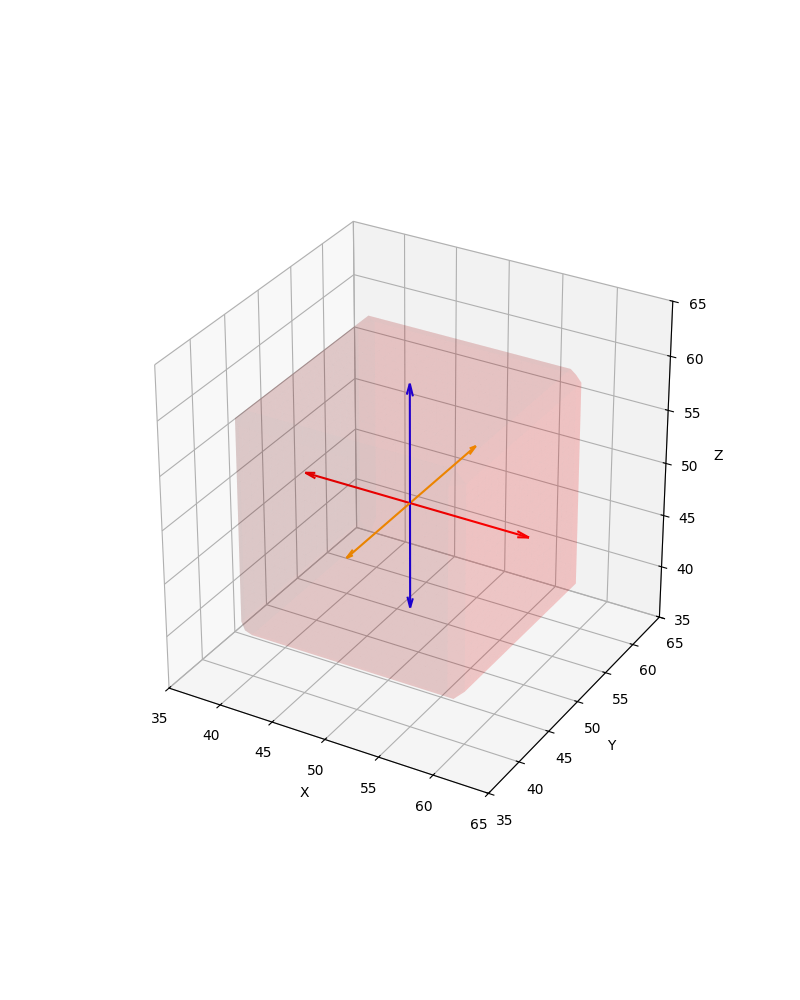

In [10]:
find_and_plot_principal_diameters(cube, xlim=(35,65), ylim=(35,65), zlim=(35,65))

# Sphere <a class="anchor" id="chapter2"></a>

In [11]:
#sphere
frame = np.zeros((100, 100, 100))

sphere_r = 20

center_x, center_y, center_z = frame.shape[0] // 2, frame.shape[1] // 2, frame.shape[2] // 2
x, y, z = np.ogrid[:frame.shape[0], :frame.shape[1], :frame.shape[2]]
sphere_mask = ((x - center_x) ** 2 + (y - center_y) ** 2 + (z - center_z) ** 2) <= sphere_r ** 2
sphere = frame
sphere[sphere_mask] = 1
sphere = sphere.astype(int)

In [12]:
props = skimage.measure.regionprops(sphere)
verts, faces, _, _ =skimage.measure.marching_cubes(sphere)
area_mc = skimage.measure.mesh_surface_area(verts, faces)

print(f'Radius = {sphere_r}')
print(f'Area - calculated = {4*np.pi*(sphere_r**2)}')
print(f'Volume - calculated = {4/3*np.pi*(sphere_r**3)}')

print('*******************************************************')

print(f'Axis major length = {props[0].axis_major_length}')
print(f'Axis minor length = {props[0].axis_minor_length}')
print(f'Max. Feret Diameter = {props[0].feret_diameter_max}')

print(f'Area - skimage marching cubes = {area_mc}')
print(f'Area - skimage regionprops = {props[0].area}')
print(f'Number of pixels - skimage measureprops = {props[0].num_pixels}')


Radius = 20
Area - calculated = 5026.548245743669
Volume - calculated = 33510.32163829113
*******************************************************
Axis major length = 39.95635474018156
Axis minor length = 39.95635474018156
Max. Feret Diameter = 41.6293165929973
Area - skimage marching cubes = 5452.9462890625
Area - skimage regionprops = 33401.0
Number of pixels - skimage measureprops = 33401


### Principal Axes

In [13]:
eigenvalues, eigenvectors = np.linalg.eig(props[0].inertia_tensor)
center = props[0].centroid
print(eigenvalues)
print(eigenvectors)
print(center)

[159.65102841 159.65102841 159.65102841]
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
(50.0, 50.0, 50.0)


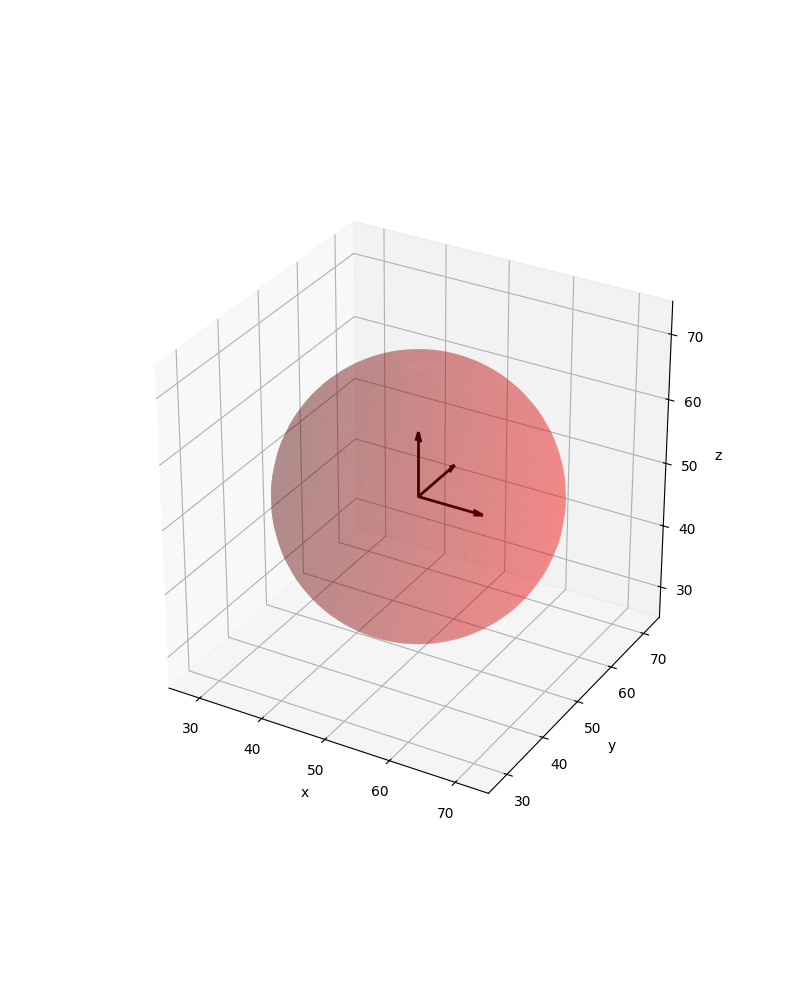

In [14]:
# Plot figure
fig = plt.figure(figsize=(8,10))
ax = fig.add_subplot(111, projection='3d')
verts, faces, _, _ = skimage.measure.marching_cubes(sphere, level=0)

r = 20

# draw sphere
u, v = np.mgrid[0:2*np.pi:50j, 0:np.pi:50j]
x = r*np.cos(u)*np.sin(v)
y = r*np.sin(u)*np.sin(v)
z = r*np.cos(v)

ax.plot_surface(center[0]-x, center[1]-y, center[2]-z, color='r', alpha=0.25)


X0,Y0,Z0 = center
X1,Y1,Z1 = zip(*eigenvectors)
ax.quiver(X0,Y0,Z0,X1,Y1,Z1, length = 10, edgecolors='k', lw=2, arrow_length_ratio = 0.15)

ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

ax.set_xlim(25,75)
ax.set_ylim(25,75)
ax.set_zlim(25,75)

ax.set_box_aspect([np.ptp(verts[:, 0]), np.ptp(verts[:, 1]), np.ptp(verts[:, 2])])

plt.show()

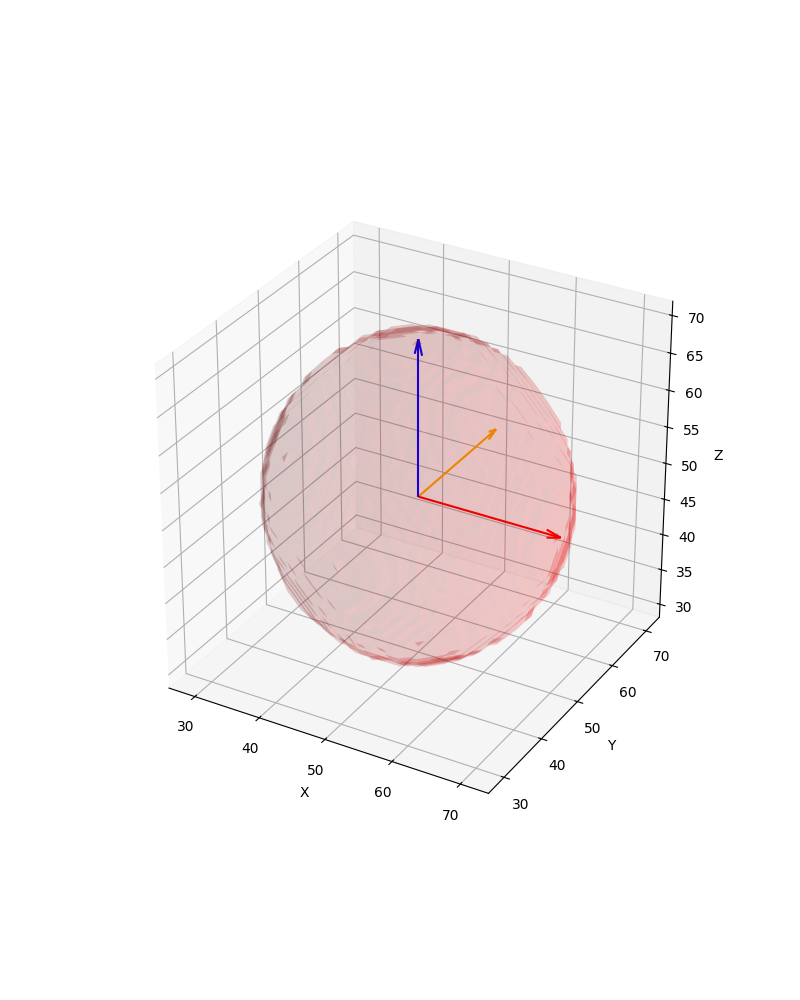

In [15]:
find_and_plot_principal_radiuses(sphere)



Principal Diameter 1 (red), Length: 42
Principal Diameter 2 (green), Length: 42
Principal Diameter 3 (blue), Length: 42


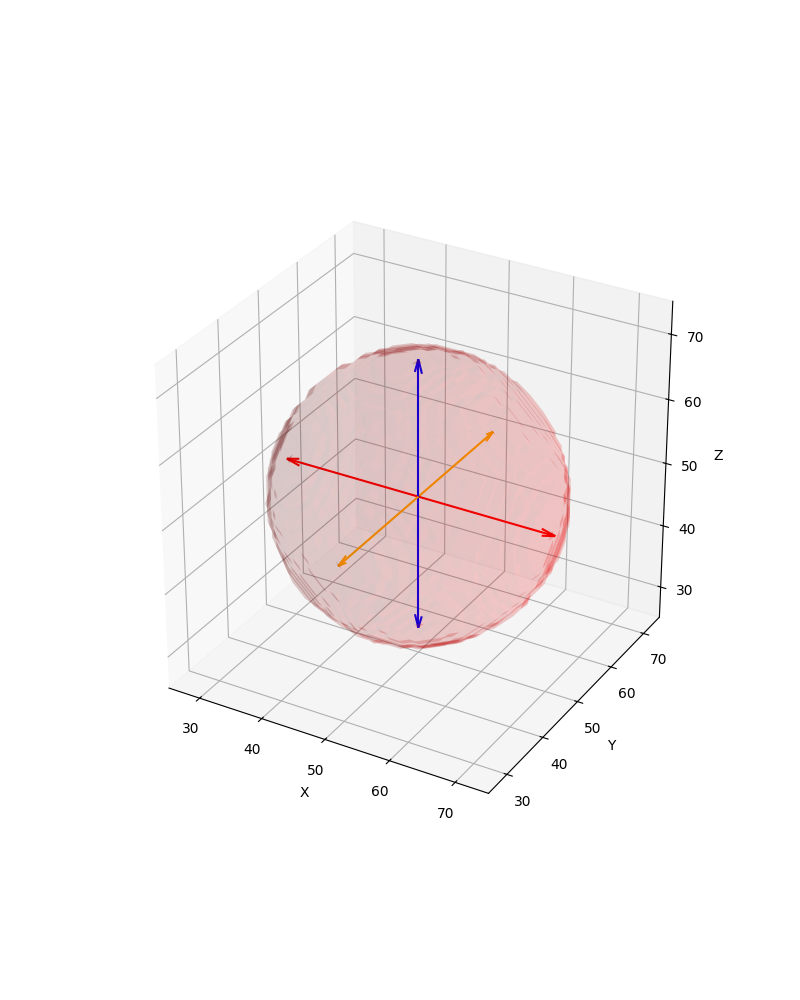

In [16]:
find_and_plot_principal_diameters(sphere, xlim=(25,75), ylim=(25,75), zlim=(25,75))

# Cylinder <a class="anchor" id="chapter3"></a>

In [17]:
#cylinder
frame = np.zeros((100, 100, 100))

cyl_r = 20
cyl_l = 60

center_x, center_y, center_z = frame.shape[0] // 2, frame.shape[1] // 2, frame.shape[2] // 2
x, y, z = np.ogrid[:frame.shape[0], :frame.shape[1], :frame.shape[2]]
cylinder_mask = (
    (x - center_x) ** 2 + (y - center_y) ** 2 <= cyl_r ** 2
) & (center_z - cyl_l // 2 <= z) & (z <= center_z + cyl_l // 2)

cylinder = frame                   
cylinder[cylinder_mask] = 1
cylinder = cylinder.astype(int)

In [18]:
props = skimage.measure.regionprops(cylinder)
verts, faces, _, _ =skimage.measure.marching_cubes(cylinder)
area_mc = skimage.measure.mesh_surface_area(verts, faces)

print(f'Radius = {cyl_r}')
print(f'Length = {cyl_l}')
print(f'Area - calculated = {2*np.pi*cyl_r*cyl_l + 2*np.pi*(cyl_r**2)}')
print(f'Volume - calculated = {np.pi*(cyl_r**2)*cyl_l}')

print('*******************************************************')

print(f'Axis major length = {props[0].axis_major_length}')
print(f'Axis minor length = {props[0].axis_minor_length}')
print(f'Max. Feret Diameter = {props[0].feret_diameter_max}')

print(f'Area - skimage marching cubes = {area_mc}')
print(f'Area - skimage regionprops = {props[0].area}')
print(f'Number of pixels - skimage measureprops = {props[0].num_pixels}')

Radius = 20
Length = 60
Area - calculated = 10053.096491487338
Volume - calculated = 75398.22368615503
*******************************************************
Axis major length = 78.74007874011811
Axis minor length = 44.73132023920247
Max. Feret Diameter = 73.21885003194191
Area - skimage marching cubes = 10658.01953125
Area - skimage regionprops = 76677.0
Number of pixels - skimage measureprops = 76677


### Principal Axes

In [19]:
eigenvalues, eigenvectors = np.linalg.eig(props[0].inertia_tensor)
center = props[0].centroid
print(eigenvalues)
print(eigenvectors)
print(center)

[410.04455052 410.04455052 200.08910103]
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
(50.0, 50.0, 50.0)


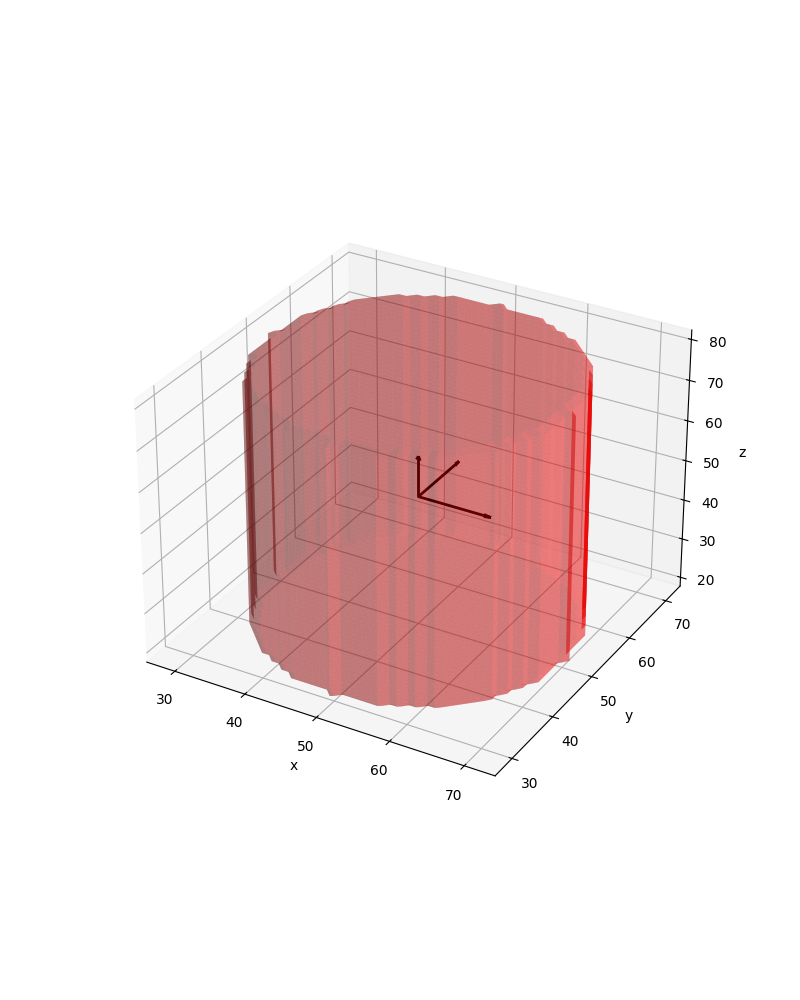

In [20]:
axes = [20,20,20]
data = np.ones(axes, dtype=bool)

 
# Plot figure
fig = plt.figure(figsize=(8,10))
ax = fig.add_subplot(111, projection='3d')

verts, faces, _, _ = skimage.measure.marching_cubes(cylinder, level=0)

# Plot the surface
ax.plot_trisurf(verts[:, 0], verts[:, 1], faces, verts[:, 2], color='r',alpha=0.3)


X0,Y0,Z0 = center
X1,Y1,Z1 = zip(*eigenvectors)
ax.quiver(X0,Y0,Z0,X1,Y1,Z1, length = 10, edgecolors='k', lw=2, arrow_length_ratio = 0.10)

ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
plt.show()


ax.set_box_aspect([np.ptp(verts[:, 0]), np.ptp(verts[:, 1]), np.ptp(verts[:, 2])])


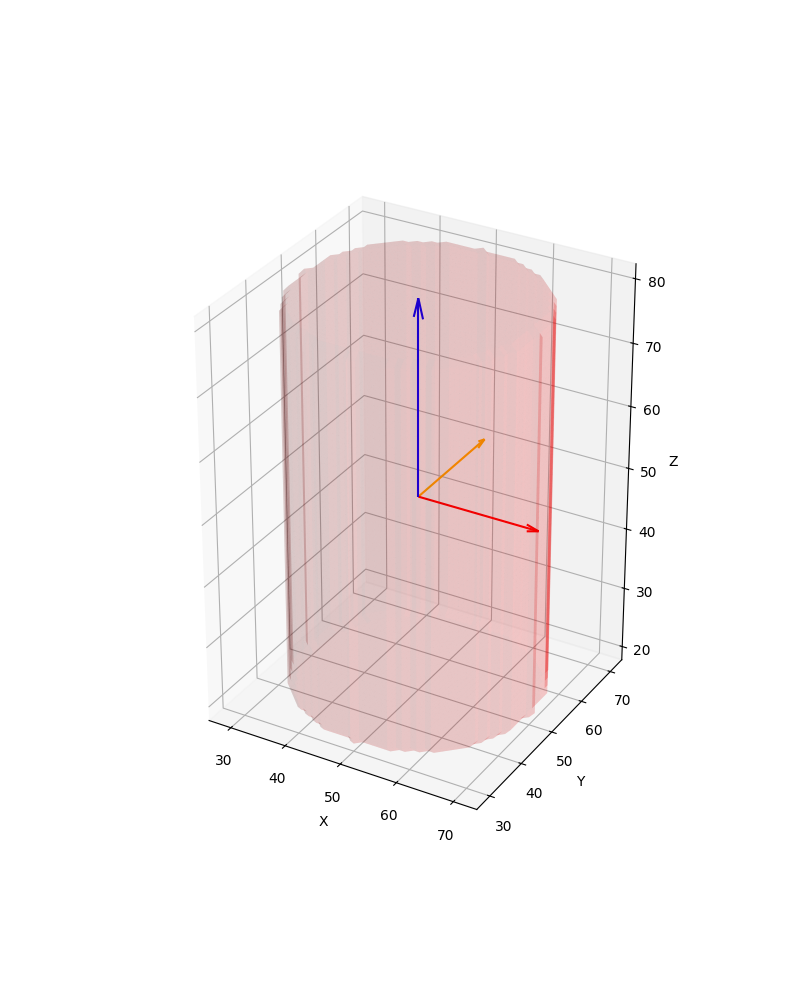

In [21]:
find_and_plot_principal_radiuses(cylinder)



Principal Diameter 1 (red), Length: 42
Principal Diameter 2 (green), Length: 42
Principal Diameter 3 (blue), Length: 62


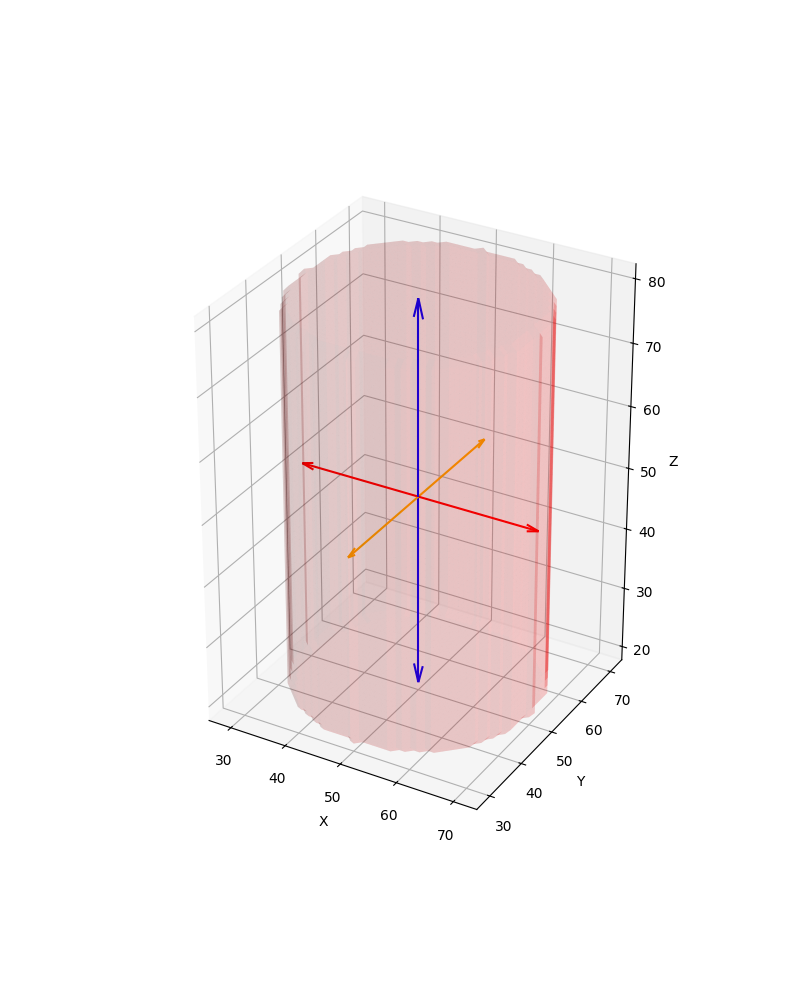

In [22]:
find_and_plot_principal_diameters(cylinder)

# Slit <a class="anchor" id="chapter4"></a>

In [23]:
frame = np.zeros((100, 100, 100))

slit_width = 20
slit_height = 10
slit_length = 40

start_x = (frame.shape[0] - slit_length) // 2
end_x = start_x + slit_length
start_y = (frame.shape[1] - slit_width) // 2
end_y = start_y + slit_width
start_z = (frame.shape[2] - slit_height) // 2
end_z = start_z + slit_height

slit = frame
slit[start_x:end_x, start_y:end_y, start_z:end_z] = 1
slit = slit.astype(int)

In [24]:
props = skimage.measure.regionprops(slit)
verts, faces, _, _ =skimage.measure.marching_cubes(slit)
area_mc = skimage.measure.mesh_surface_area(verts, faces)

print(f'Width, height, length = {slit_width, slit_height, slit_length}')
print(f'Area - calculated = {2*(slit_width*slit_height + slit_width*slit_length + slit_height*slit_length)}')
print(f'Volume - calculated = {slit_width*slit_height*slit_length}')
print('*******************************************************')
print(f'Axis major length = {props[0].axis_major_length}')
print(f'Axis minor length = {props[0].axis_minor_length}')
print(f'Max. Feret Diameter = {props[0].feret_diameter_max}')

print(f'Area - skimage marching cubes = {area_mc}')
print(f'Area - skimage regionprops = {props[0].area}')
print(f'Number of pixels - skimage measureprops = {props[0].num_pixels}')

Width, height, length = (20, 10, 40)
Area - calculated = 2800
Volume - calculated = 8000
*******************************************************
Axis major length = 51.62363799656123
Axis minor length = 12.84523257866513
Max. Feret Diameter = 45.18849411078001
Area - skimage marching cubes = 2717.23681640625
Area - skimage regionprops = 8000.0
Number of pixels - skimage measureprops = 8000


In [25]:
eigenvalues, eigenvectors = np.linalg.eig(props[0].inertia_tensor)
center = props[0].centroid
print(eigenvalues)
print(eigenvectors)
print(center)

[ 41.5 141.5 166.5]
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
(49.5, 49.5, 49.5)


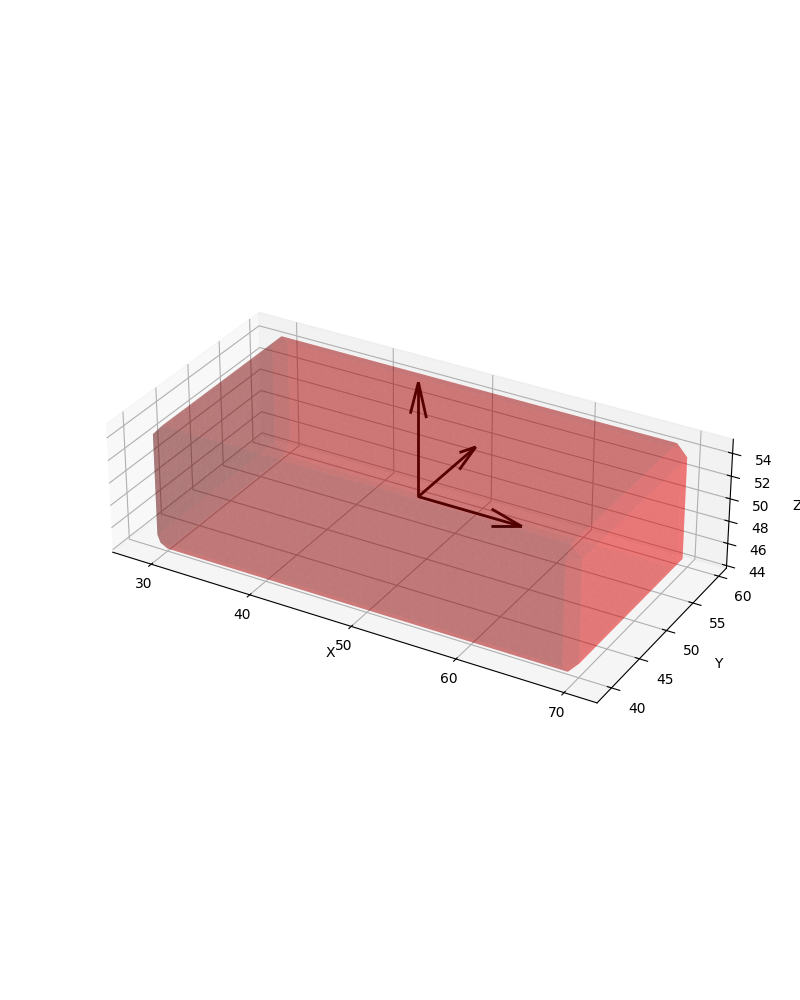

In [26]:
# Create a mesh using marching cubes
verts, faces, _, _ = skimage.measure.marching_cubes(slit, level=0)

# Plotting
fig = plt.figure(figsize=(8,10))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_trisurf(verts[:, 0], verts[:, 1], faces, verts[:, 2], color='r',alpha=0.3)

X0,Y0,Z0 = center
X1,Y1,Z1 = zip(*eigenvectors)
ax.quiver(X0,Y0,Z0,X1,Y1,Z1, length = 10, edgecolors='k', lw=2)


ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

ax.set_box_aspect([np.ptp(verts[:, 0]), np.ptp(verts[:, 1]), np.ptp(verts[:, 2])])

plt.show()


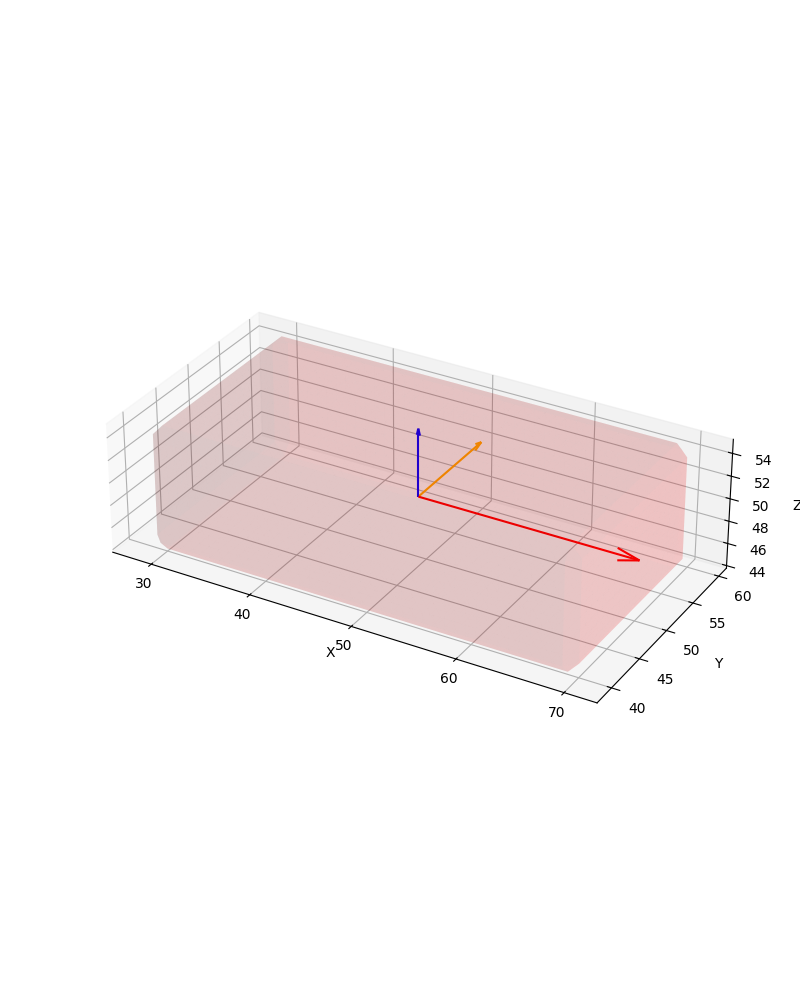

In [27]:
find_and_plot_principal_radiuses(slit)



Principal Diameter 1 (red), Length: 11
Principal Diameter 2 (green), Length: 21
Principal Diameter 3 (blue), Length: 41


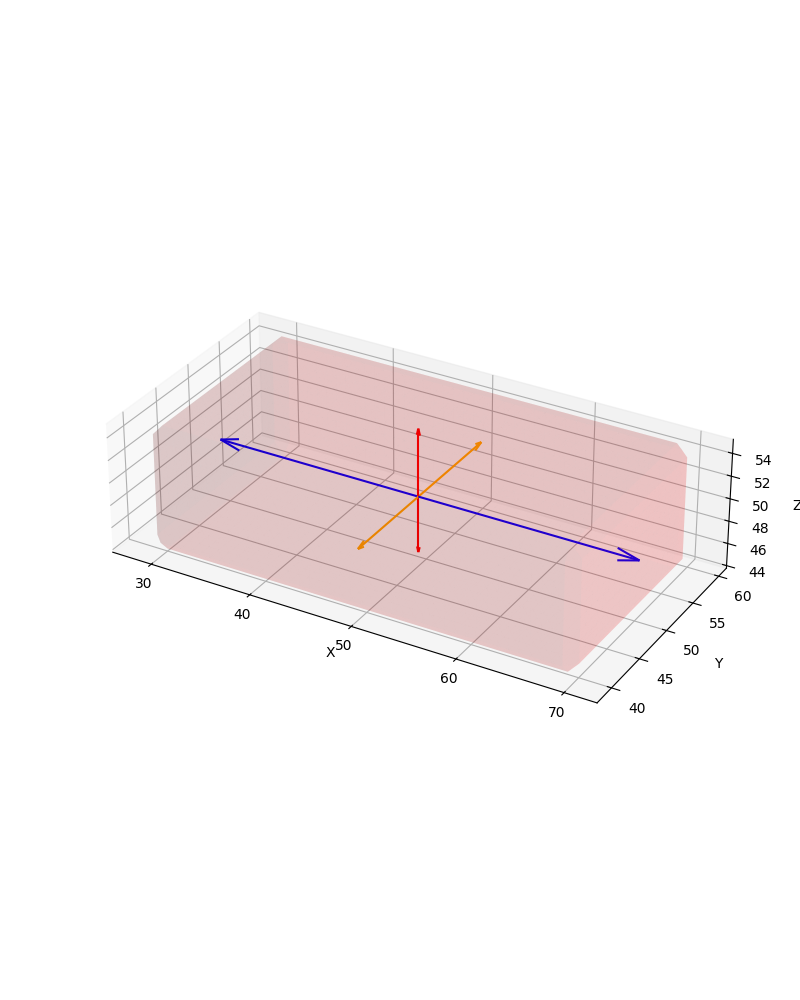

In [28]:
find_and_plot_principal_diameters(slit)

# Rotated Slit <a class="anchor" id="chapter5"></a>

In [29]:
# frame = np.zeros((100, 100, 100))

# slit_width = 20
# slit_height = 15
# slit_length = 50

# start_x = (frame.shape[0] - slit_length) // 2
# end_x = start_x + slit_length
# start_y = (frame.shape[1] - slit_width) // 2
# end_y = start_y + slit_width
# start_z = (frame.shape[2] - slit_height) // 2
# end_z = start_z + slit_height

# # Create a parallelogram-shaped slit
# slit = np.zeros_like(frame)
# slit[start_x:end_x, start_y:end_y, start_z:end_z] = 1

# # Define the rotation matrix for a 45-degree rotation around z-axis
# rotation_matrix = np.array([
#     [np.cos(np.pi / 4), -np.sin(np.pi / 4), 0],
#     [np.sin(np.pi / 4), np.cos(np.pi / 4), 0],
#     [0, 0, 1]
# ])

# # Apply the affine transformation
# rotated_slit = scipy.ndimage.affine_transform(slit, rotation_matrix)
# rotated_slit = rotated_slit.astype('int')
frame = np.zeros((100, 100, 100))

slit_width = 10
slit_height = 25
slit_length = 5

start_x = (frame.shape[0] - slit_length) // 2 + 40
end_x = start_x + slit_length
start_y = (frame.shape[1] - slit_width) // 2 - 20
end_y = start_y + slit_width
start_z = (frame.shape[2] - slit_height) // 2
end_z = start_z + slit_height

# Create a parallelogram-shaped slit
slit = np.zeros_like(frame)
slit[start_x:end_x, start_y:end_y, start_z:end_z] = 1

# Define the rotation matrix for a 45-degree rotation around z-axis
rotation_matrix = np.array([
    [np.cos(np.pi / 4), -np.sin(np.pi / 4), 0, 0],
    [np.sin(np.pi / 4), np.cos(np.pi / 4), 0, 0],
    [0, 0, 1, 0],
    [0, 0, 0, 1]
])

# Apply the 3D rotation transformation
rotated_slit = np.zeros_like(frame)
for x in range(frame.shape[0]):
    for y in range(frame.shape[1]):
        for z in range(frame.shape[2]):
            if slit[x, y, z] == 1:
                input_coords = np.array([x, y, z, 1])
                output_coords = np.dot(rotation_matrix, input_coords)
                rotated_x, rotated_y, rotated_z, _ = output_coords.astype(int)
                if 0 <= rotated_x < frame.shape[0] and 0 <= rotated_y < frame.shape[1] and 0 <= rotated_z < frame.shape[2]:
                    rotated_slit[rotated_x, rotated_y, rotated_z] = 1
rotated_slit = rotated_slit.astype('int')

In [30]:
props = skimage.measure.regionprops(rotated_slit)
verts, faces, _, _ =skimage.measure.marching_cubes(rotated_slit)
area_mc = skimage.measure.mesh_surface_area(verts, faces)

print(f'Width, height, length = {slit_width, slit_height, slit_length}')
print(f'Area - calculated = {2*(slit_width*slit_height + slit_width*slit_length + slit_height*slit_length)}')
print(f'Volume - calculated = {slit_width*slit_height*slit_length}')
print('*******************************************************')
print(f'Axis major length = {props[0].axis_major_length}')
print(f'Axis minor length = {props[0].axis_minor_length}')
print(f'Max. Feret Diameter = {props[0].feret_diameter_max}')

print(f'Area - skimage marching cubes = {area_mc}')
print(f'Area - skimage regionprops = {props[0].area}')
print(f'Number of pixels - skimage measureprops = {props[0].num_pixels}')

Width, height, length = (10, 25, 5)
Area - calculated = 850
Volume - calculated = 1250
*******************************************************
Axis major length = 32.249030993194204
Axis minor length = 6.437288331424974
Max. Feret Diameter = 26.870057685088806
Area - skimage marching cubes = 1285.435302734375
Area - skimage regionprops = 1025.0
Number of pixels - skimage measureprops = 1025


### Principal Axes

In [31]:
eigenvalues, eigenvectors = np.linalg.eig(props[0].inertia_tensor)
center = props[0].centroid
print(eigenvalues)
print(eigenvectors)
print(center)

[59.98636458 54.07193405 10.05829863]
[[ 0.7090954  -0.70511255  0.        ]
 [ 0.70511255  0.7090954   0.        ]
 [ 0.          0.          1.        ]]
(41.63414634146341, 83.3170731707317, 49.0)


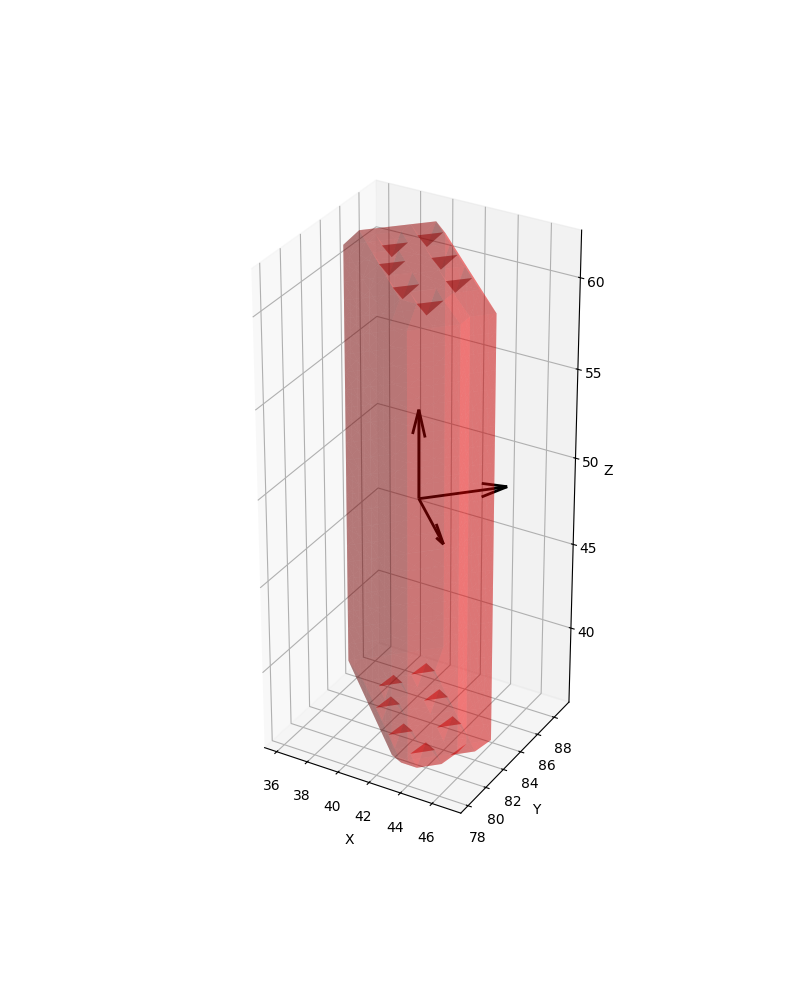

In [32]:
# Create a mesh using marching cubes
verts, faces, _, _ = skimage.measure.marching_cubes(rotated_slit, level=0)

# Plotting
fig = plt.figure(figsize=(8,10))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_trisurf(verts[:, 0], verts[:, 1], faces, verts[:, 2], color='r',alpha=0.3)

X0,Y0,Z0 = center
X1,Y1,Z1 = zip(*eigenvectors)
ax.quiver(X0,Y0,Z0,X1,Y1,Z1, length = 5, edgecolors='k', lw=2)


ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

ax.set_box_aspect([np.ptp(verts[:, 0]), np.ptp(verts[:, 1]), np.ptp(verts[:, 2])])

plt.show()


### Find and Plot Principal Diameters

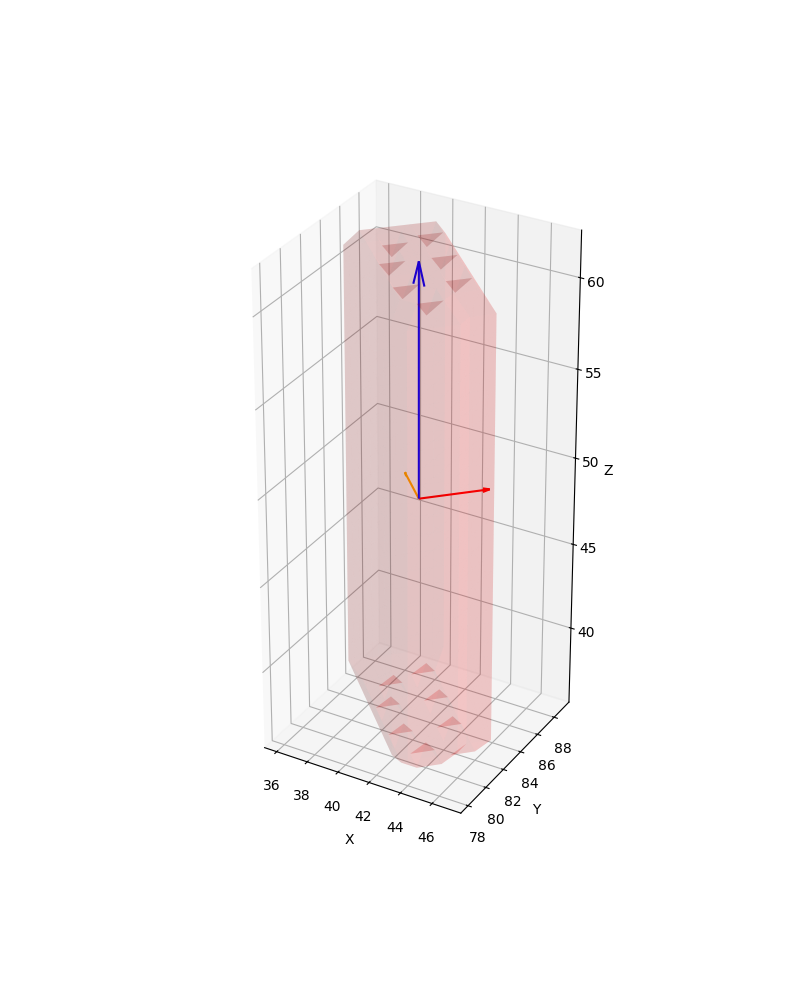

In [33]:
find_and_plot_principal_radiuses(rotated_slit)



Principal Diameter 1 (red), Length: 6
Principal Diameter 2 (green), Length: 7
Principal Diameter 3 (blue), Length: 26


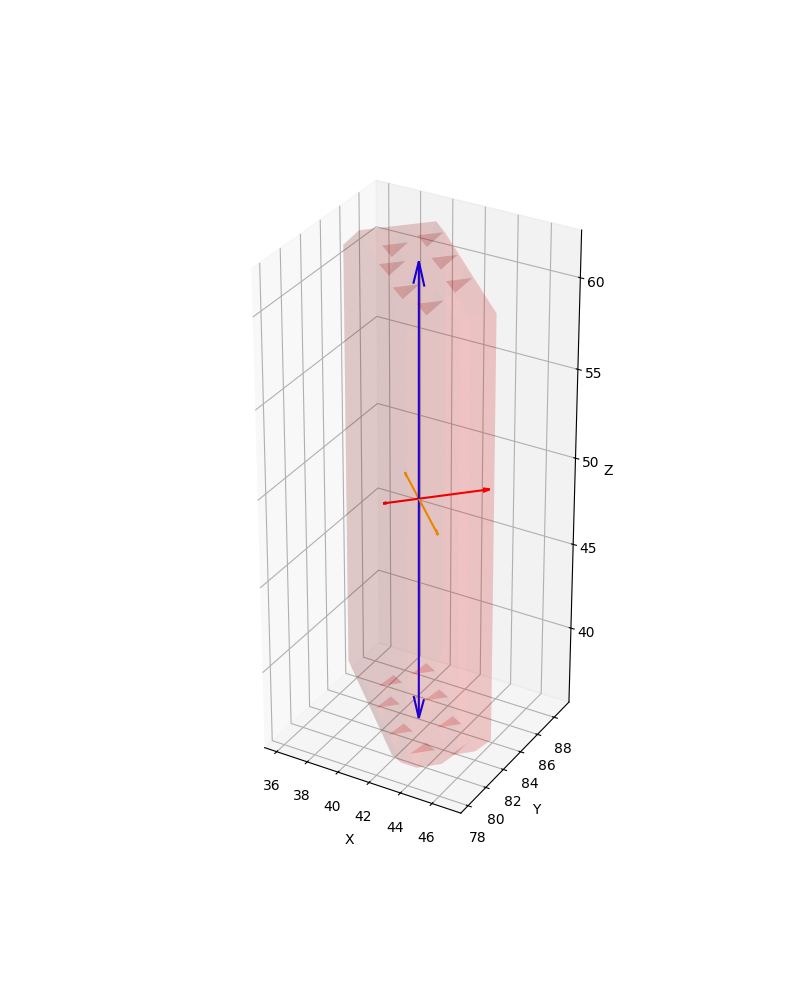

In [34]:
find_and_plot_principal_diameters(rotated_slit)

# Ellipsoid <a class="anchor" id="chapter6"></a>

In [35]:
# Define frame dimensions
frame = np.zeros((100, 100, 100))

# Ellipse parameters
center = [50, 50, 50]  # Center coordinates
a = 15  # Semi-major axis length along x
b = 10  # Semi-major axis length along y
c = 5   # Semi-major axis length along z

# Create ellipsoid points
x = np.linspace(0, 99, 100)
y = np.linspace(0, 99, 100)
z = np.linspace(0, 99, 100)
xv, yv, zv = np.meshgrid(x, y, z, indexing='ij')

# Equation of the ellipsoid in 3D
ellipsoid = ((xv - center[0]) ** 2) / (a ** 2) + ((yv - center[1]) ** 2) / (b ** 2) + ((zv - center[2]) ** 2) / (c ** 2)

# Filter points inside the ellipsoid
ellipsoid[ellipsoid <= 1] = 1
ellipsoid[ellipsoid > 1] = 0
ellipsoid=ellipsoid.astype(int)

In [36]:
props = skimage.measure.regionprops(ellipsoid)
verts, faces, _, _ =skimage.measure.marching_cubes(ellipsoid)
area_mc = skimage.measure.mesh_surface_area(verts, faces)

print(f'Axes along, x,y,z: = {a, b, c}')
print(f'Area - calculated = {4 * np.pi * (((a * b) ** 1.6 + (a * c) ** 1.6 + (b * c) ** 1.6) / 3) ** (1 / 1.6)}')
print(f'Volume - calculated = {(4 / 3) * np.pi * a * b * c}')
print('*******************************************************')
print(f'Axis major length = {props[0].axis_major_length}')
print(f'Axis minor length = {props[0].axis_minor_length}')
print(f'Max. Feret Diameter = {props[0].feret_diameter_max}')

print(f'Area - skimage marching cubes = {area_mc}')
print(f'Area - skimage regionprops = {props[0].area}')
print(f'Number of pixels - skimage measureprops = {props[0].num_pixels}')

Axes along, x,y,z: = (15, 10, 5)
Area - calculated = 1223.4156346392629
Volume - calculated = 3141.5926535897925
*******************************************************
Axis major length = 30.037231160405625
Axis minor length = 9.770917940824257
Max. Feret Diameter = 31.064449134018133
Area - skimage marching cubes = 1313.324951171875
Area - skimage regionprops = 3069.0
Number of pixels - skimage measureprops = 3069


### Principal Diameters

In [37]:
eigenvalues, eigenvectors = np.linalg.eig(props[0].inertia_tensor)
center = props[0].centroid
print(eigenvalues)
print(eigenvectors)
print(center)

[24.69859889 49.88530466 65.03681981]
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
(50.0, 50.0, 50.0)


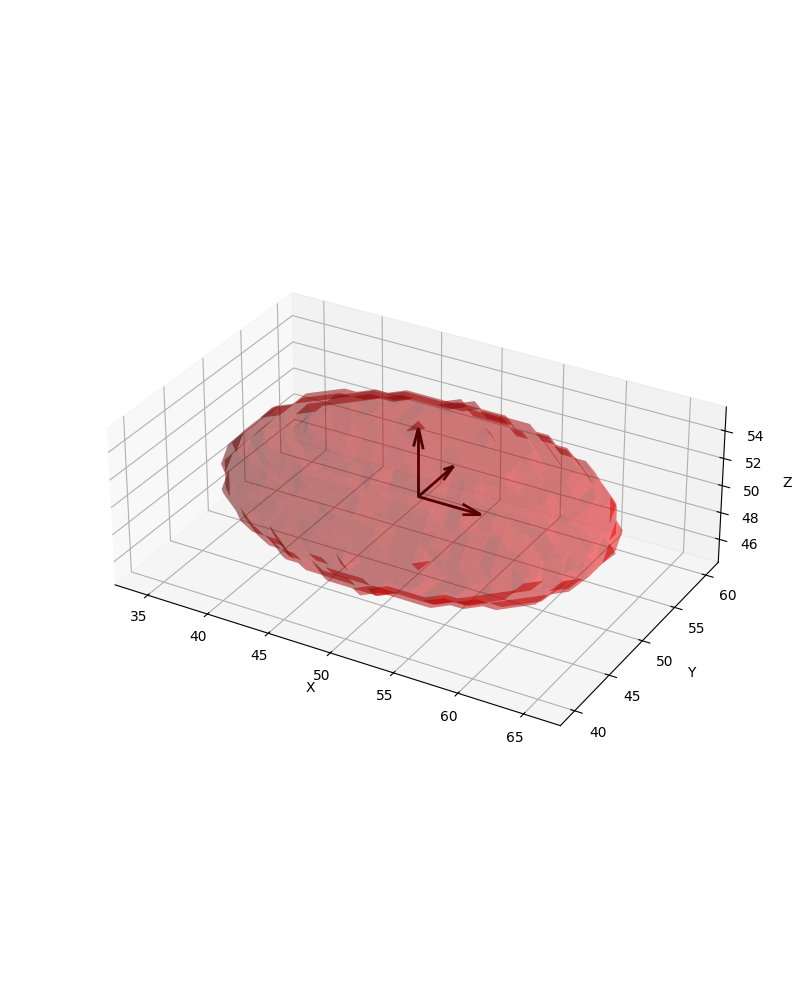

In [38]:
# Create a mesh using marching cubes
verts, faces, _, _ = skimage.measure.marching_cubes(ellipsoid)

# Plotting
fig = plt.figure(figsize=(8,10))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_trisurf(verts[:, 0], verts[:, 1], faces, verts[:, 2], color='r',alpha=0.3)

X0,Y0,Z0 = center
X1,Y1,Z1 = zip(*eigenvectors)
ax.quiver(X0,Y0,Z0,X1,Y1,Z1, length = 5, edgecolors='k', lw=2)


ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

ax.set_box_aspect([np.ptp(verts[:, 0]), np.ptp(verts[:, 1]), np.ptp(verts[:, 2])])

plt.show()


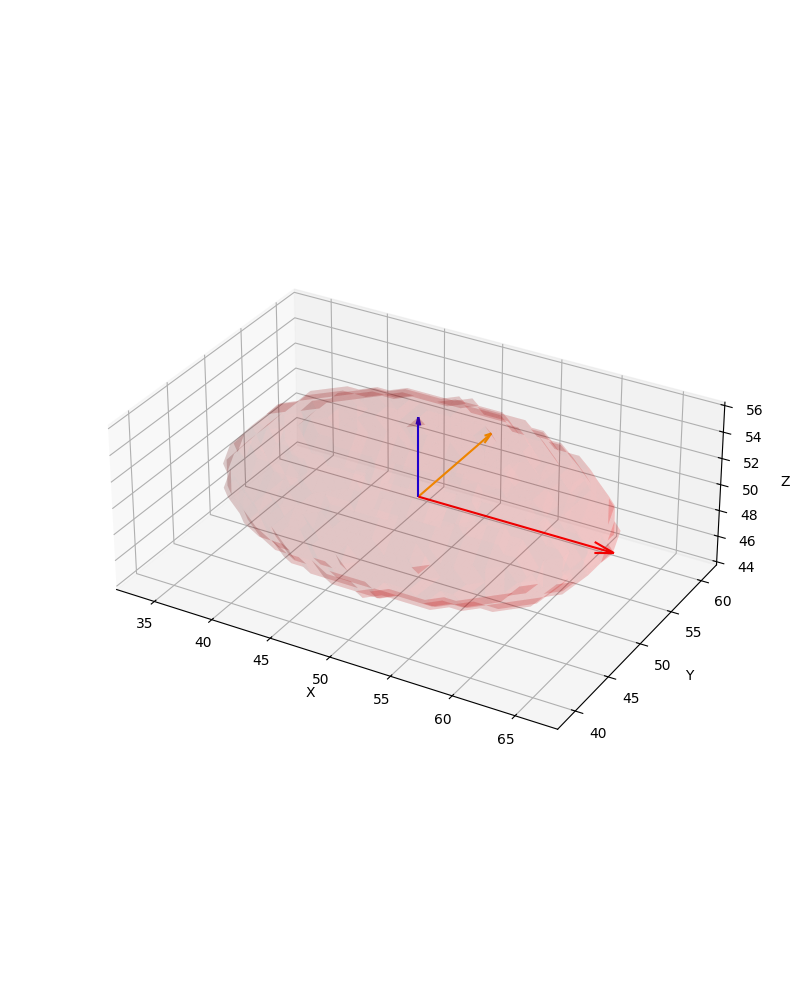

In [39]:
find_and_plot_principal_radiuses(ellipsoid)



Principal Diameter 1 (red), Length: 12
Principal Diameter 2 (green), Length: 22
Principal Diameter 3 (blue), Length: 32


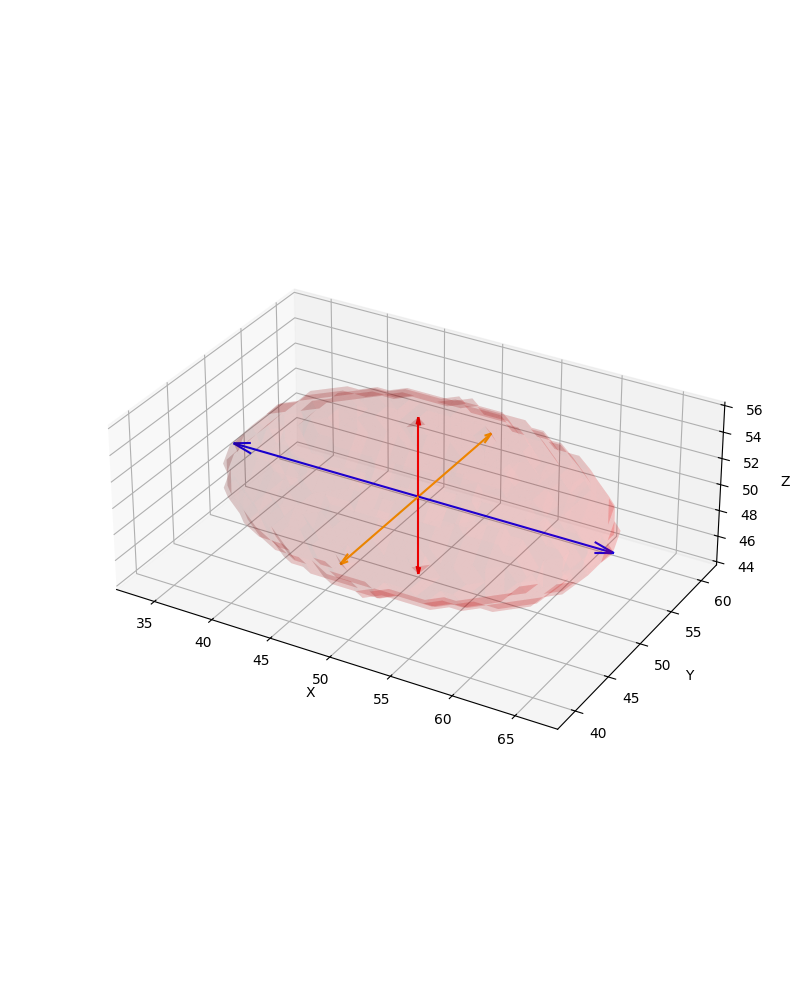

In [40]:
find_and_plot_principal_diameters(ellipsoid)

# Concave Sphere <a class="anchor" id="chapter7"></a>

In [41]:
radius = 15
thickness = 1
small_radius = 10
indentation = 10
resolution = 50

# Create 3D grid of coordinates
x, y, z = np.mgrid[-radius:radius:resolution * 1j,
                   -radius:radius:resolution * 1j,
                   -radius:radius:resolution * 1j]

# Calculate distances from both spheres
large_sphere_distance = np.sqrt(x**2 + y**2 + z**2)
indentation_sphere_distance = np.sqrt((x + small_radius/2)**2 + (y + small_radius/2)**2 + (z - indentation)**2)

# Create concave shape by subtracting indentation sphere from large sphere
concave_sphere = np.logical_and(large_sphere_distance <= radius - thickness, indentation_sphere_distance >= small_radius)
concave_sphere=concave_sphere.astype(int)

In [42]:
props = skimage.measure.regionprops(concave_sphere)
verts, faces, _, _ =skimage.measure.marching_cubes(concave_sphere)
area_mc = skimage.measure.mesh_surface_area(verts, faces)

# print(f'Axes along, x,y,z: = {a, b, c}')
# print(f'Area - calculated = {4 * np.pi * (((a * b) ** 1.6 + (a * c) ** 1.6 + (b * c) ** 1.6) / 3) ** (1 / 1.6)}')
# print(f'Volume - calculated = {(4 / 3) * np.pi * a * b * c}')
# print('*******************************************************')
print(f'Axis major length = {props[0].axis_major_length}')
print(f'Axis minor length = {props[0].axis_minor_length}')
print(f'Max. Feret Diameter = {props[0].feret_diameter_max}')

print(f'Area - skimage marching cubes = {area_mc}')
print(f'Area - skimage regionprops = {props[0].area}')
print(f'Number of pixels - skimage measureprops = {props[0].num_pixels}')

Axis major length = 48.43994273842171
Axis minor length = 38.230939325348984
Max. Feret Diameter = 47.43416490252569
Area - skimage marching cubes = 7514.9345703125
Area - skimage regionprops = 41294.0
Number of pixels - skimage measureprops = 41294


### Principal Diameters

In [43]:
eigenvalues, eigenvectors = np.linalg.eig(props[0].inertia_tensor)
center = props[0].centroid
print(eigenvalues)
print(eigenvectors)
print(center)

[234.63589978 190.39473324 190.40163871]
[[ 4.07253427e-01 -7.07106781e-01 -5.78052460e-01]
 [ 4.07253427e-01  7.07106781e-01 -5.78052460e-01]
 [-8.17489629e-01  2.93465001e-12 -5.75943319e-01]]
(25.7196929335981, 25.7196929335981, 22.05518961592483)


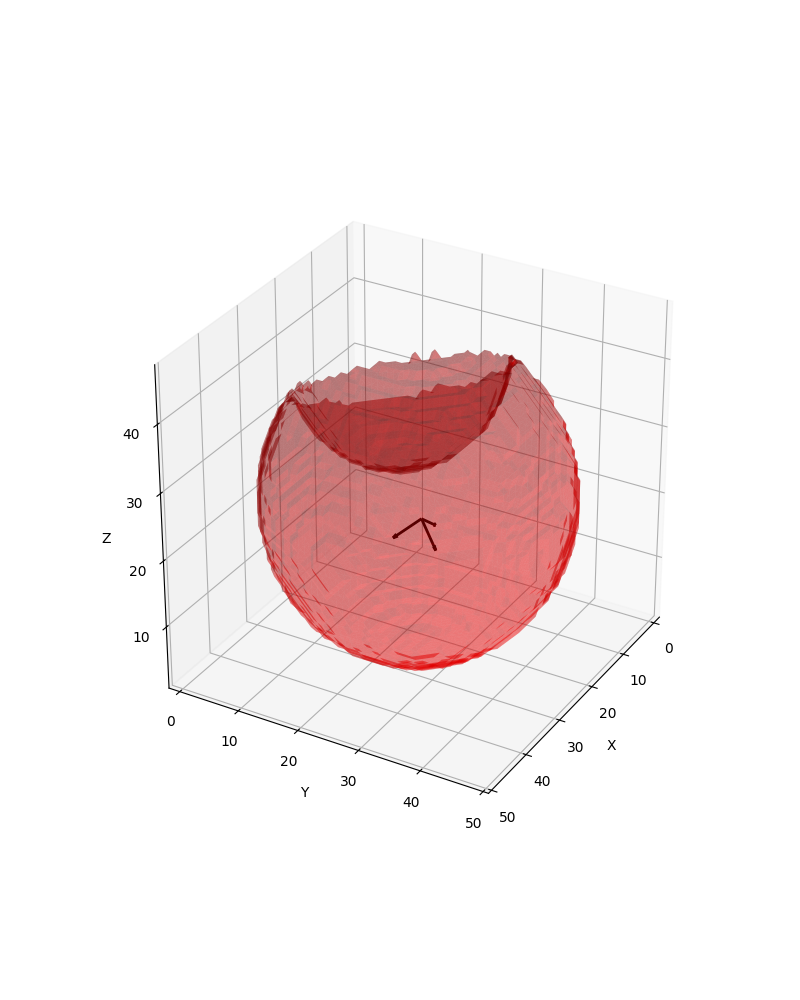

In [44]:
# Create a mesh using marching cubes
verts, faces, _, _ = skimage.measure.marching_cubes(concave_sphere)

# Plotting
fig = plt.figure(figsize=(8,10))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=30, azim=30, roll=0)

# Plot the surface
ax.plot_trisurf(verts[:, 0], verts[:, 1], faces, verts[:, 2], color='r',alpha=0.3)

X0,Y0,Z0 = center
X1,Y1,Z1 = zip(*eigenvectors)
ax.quiver(X0,Y0,Z0,X1,Y1,Z1, length = 5, edgecolors='k', lw=2, arrow_length_ratio = 0.15)


ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

ax.set_box_aspect([np.ptp(verts[:, 0]), np.ptp(verts[:, 1]), np.ptp(verts[:, 2])])

plt.show()


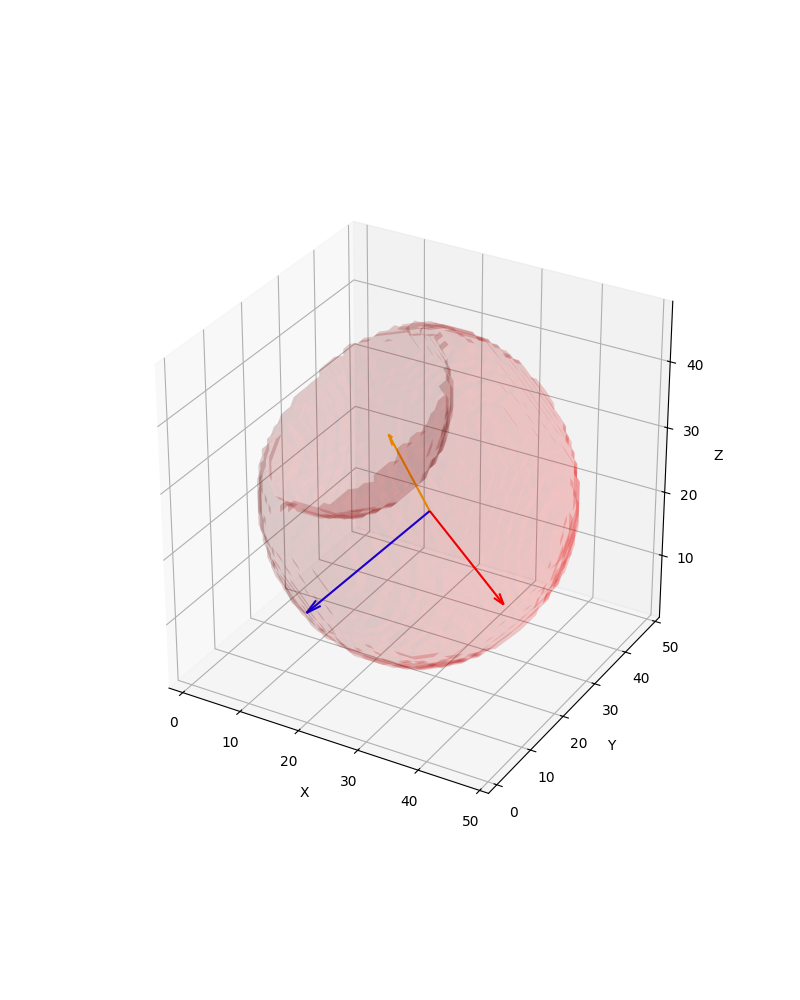

In [45]:
find_and_plot_principal_radiuses(concave_sphere)



Principal Diameter 1 (red), Length: 27
Principal Diameter 2 (green), Length: 46
Principal Diameter 3 (blue), Length: 48


/tmp/ipykernel_304/4234981739.py:89: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(8,10))


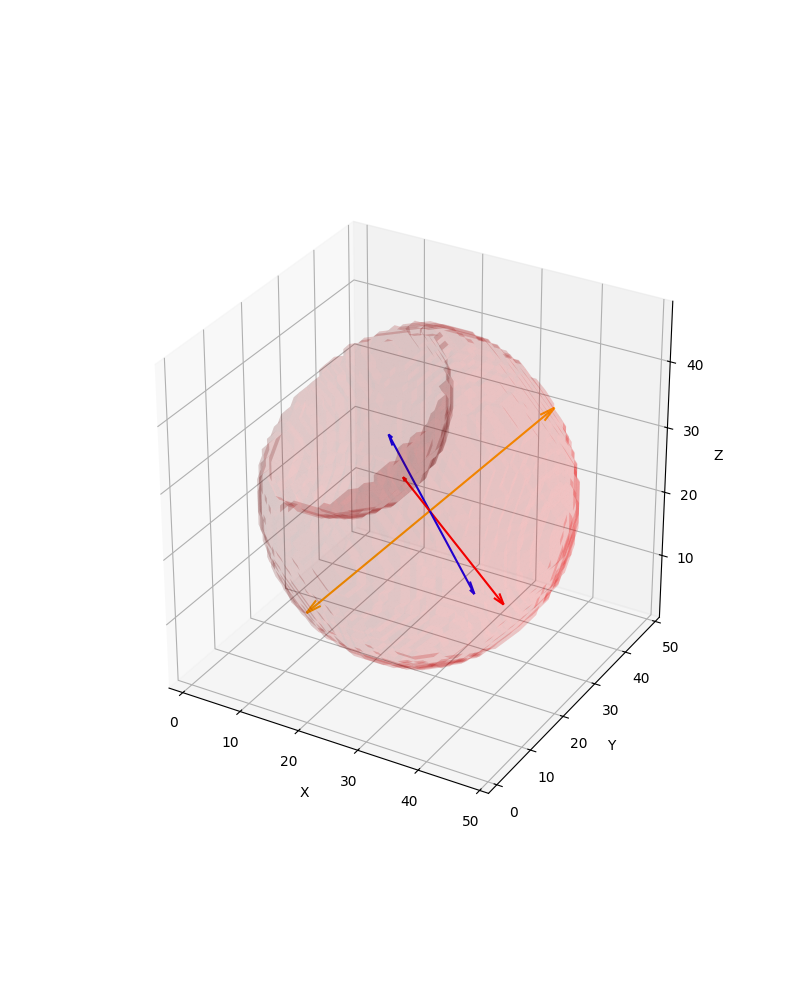

In [46]:
find_and_plot_principal_diameters(concave_sphere)